<a href="https://colab.research.google.com/github/WolfPitToad/Stringstein/blob/main/RNN_Final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Práctica #3: Elaboración de Texto con RNN**

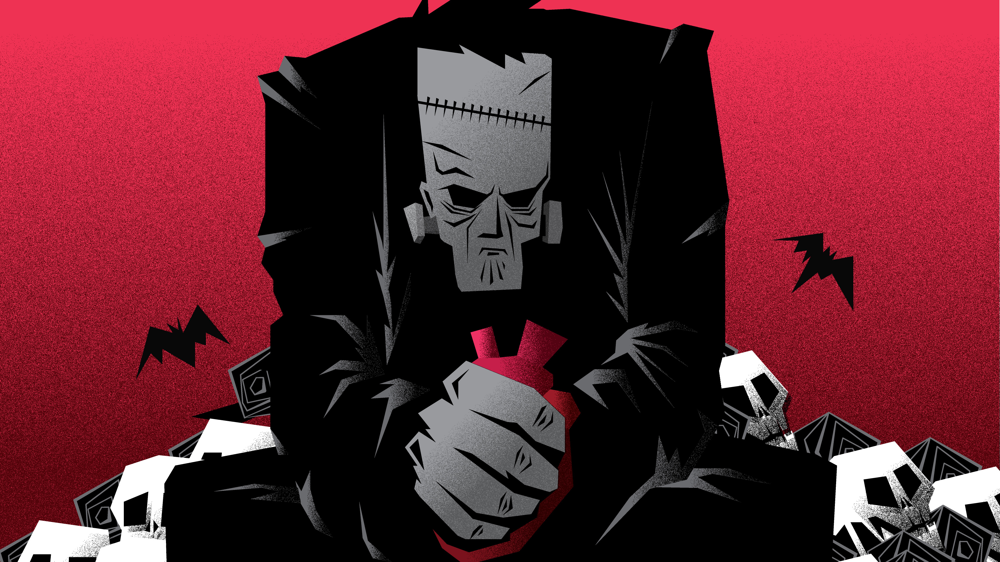


*Centro Universitario de Ciencias Exactas e Ingenierías*

*División de Tecnologías para la Integración Ciber-Humana*

*Ingeniería Biomédica*

<br>

*Mtra. Sofía Alejandra Aguilar Valdez*

7 de octubre de 2022


---

## **Información del equipo**

```NOMBRES:``` Andrés Alejandro Sánchez Plascencia

```CÓDIGOS:``` 216466778


```LINK REPOSITORIO:``` 


---

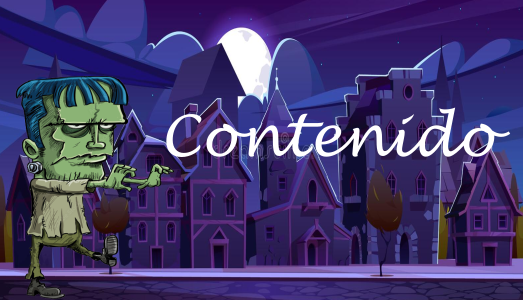


🗲   Resumen


🗲   Marco teórico



🗲  Objetivos


🗲   Materiales y métodos

 
🗲  Resultados


🗲  Discusión


🗲  Conclusiones


🗲  Referencias


---


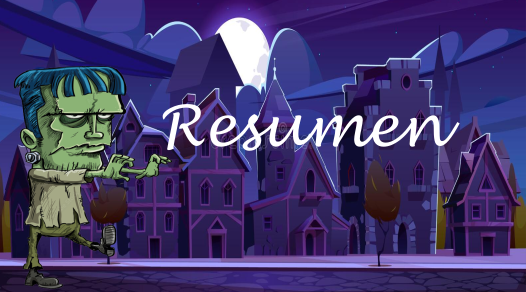


En este trabajo se pretendía realizar un modelo de Red Neuronal Recurrente para la creación de textos de manera independiente y con un discurso, gramatica y estructura naturales y faciles de leer para el ser humano. Para esto utilizamos el libro de Frankenstein de Mary Shelley, como plataforma de entrenamiento y utilizando las herramientas de Tensorflow asi como modelos ya existentes para la demostracion de esta poderosa arquitecura de redes neuronales.



---

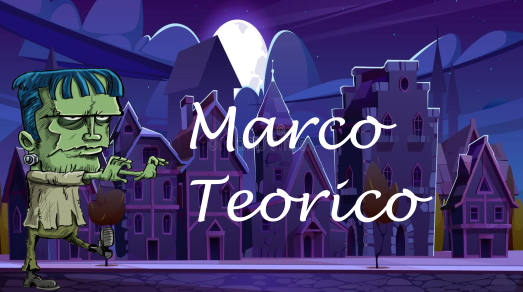

El modelo de predicción de generación de textos se sustenta en el uso de redes neuronales recurrentes para el procesamiento y entrenamiento a base de textos complejos para el desarrollo de una comprensión del lenguaje natural con el proposito no solo de ser capaz de extraer caracteristicas de este sino tambien tener la capacidad de crear lenguaje natural por su cuenta

Para trabajos de esta naturaleza existe una amplia gama de recursos y de modelos ya existentes los cuales son una gran guía para la realización de este trabajo. Entre las herramientas importantes a analizar existen las GRU (Gated Recurrent Unit) y las LSTM (Long Short Term Memory) las cuales son arquitecturas de redes neuronales recurrentes las cuales son capaces de aprender patrones de texto complejos y de largo plazo, esto es posible gracias a la capacidad de estas redes de recordar información de pasos anteriores y de tener la capacidad de olvidar información que no es relevante para el proceso de aprendizaje. Asimismo existen otros modelos como el Transformer el cual es un modelo de atencion el cual es capaz de aprender patrones de texto complejos y de largo plazo. Dentro ya del ambito comercial OpenAI se lleva el estrellato con sus modelos de la estructura GPT-3 como son DaVinci3, Curie3, Ada3, Babbage3, etc. los cuales son modelos de lenguaje natural los cuales son capaces de generar texto de manera autonoma y de manera muy natural.


---

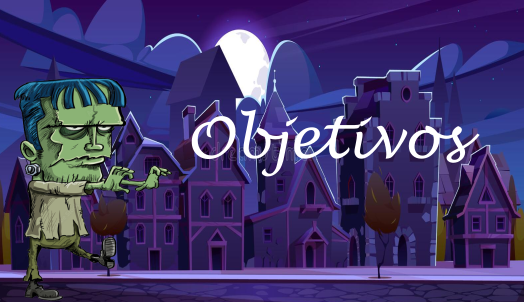

* Crear una red neuronal con la capacidad de generar textos con sentido y coherencia en su discurso.

* Procesar los datos y crear los objetos e instancias necesarios para poder hacer correr un modelo de construccion de textos basandonos en la obra de Frankenstein de Mary Shelley.

* Analizar los textos generados por la red neuronal y determinar si son coherentes con la obra original.



---

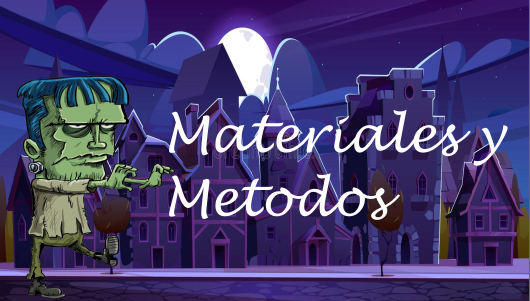

Para la realización de este proyecto se utilizaron los siguientes materiales: Frankesntein de Mary Shelley, extraido de The Gutenberg Proyect.


---






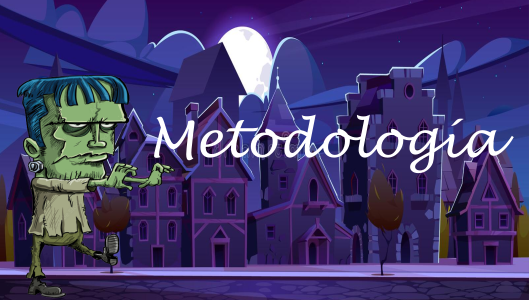

##**GRU (Gated Recurrent Units)**##

Dado a la variedad de topologias de Redes Recurrentes, se propone utilizar un modelo basado en GRU dado a que se planea usar largas secuencias de strings y las unidades GRU cuentan con mecanismos interesantes para compensar las capacidades de memoria de las RNN, mismos que se detallaran más adelante


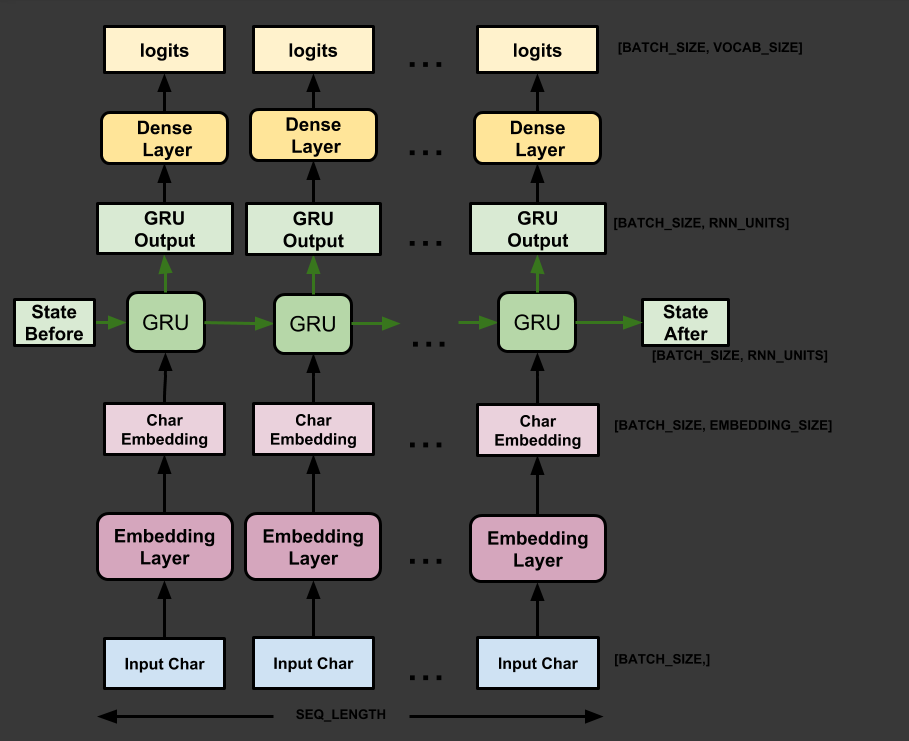

Previo a la programación de la red, se realizó una exploración inicial de los datos.





In [1]:
#Import Modules
import matplotlib.pyplot as plt
import requests
import nltk
import re
from bs4 import BeautifulSoup
import numpy as np
import random
import tensorflow as tf
import os

In [2]:
from traitlets.utils import text
url= 'https://www.gutenberg.org/cache/epub/42324/pg42324.txt' #Url
book=requests.get(url) 
soup=BeautifulSoup(book.text,'html.parser')
text=soup.get_text() #Generate the text
print ('"'+text[439289:439322]+'"') #A phrase excracted from the book
words=re.findall('\w+',text)#list with all the words inside the text

"Evil
thenceforth became my good."


Gráfica con las 15 palabras más frecuentes dentro del libro de Frankstein

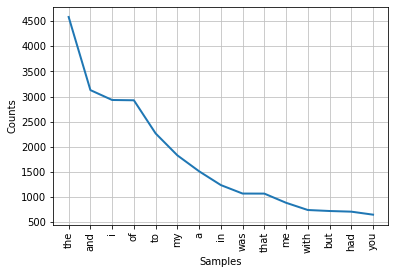

In [3]:
#Eliminate Upper chracters from the data
w_list=[]
for word in words:
  w_list.append(word.lower()) #Add another element in the list
text_l=nltk.Text(w_list) 
#Get all the words frequency
frqdis=nltk.FreqDist(w_list)
#Generate unique vector of words in alphabetical order instead of frequency
values, counts = np.unique(text_l, return_counts=True)
frqdis.plot(15)

In [4]:
#Get a random word from the list and its number of appearences
example_w = []
for a in range (3):
  rd_nums=np.random.randint(1,len(counts))
  print ('Word "'+ values[rd_nums]+ '", times found:')
  print(counts[rd_nums])
  example_w.append(values[rd_nums])

Word "collection", times found:
4
Word "entrancingly", times found:
1
Word "whispered", times found:
4


##**Preprocesamiento de los Datos**##
Previo al entrenamiento de la red se debe codificar los caracteres dentro del texto, por lo tanto analizamos los caracteres unicos pertenecientes al texto incicial:

In [5]:
#Get unique characters
vocab = sorted(set(text))
print(f'{len(vocab)} unique characters')

92 unique characters


Con la finalidad de disminuir la cantidad de caracteres para agilizar el procesamiento de los datos, se propone utilizar las letras pertenecientes al alfabeto inglés (26 letras), añadiendo ádemas los numeros del 0-9, entre otros signos de puntuación

In [6]:
#Generate new vocabulary
import string
vocab = string.ascii_letters + " .,;'1234567890"+'\r'+'\n'
print(vocab)
print(len(vocab))

abcdefghijklmnopqrstuvwxyzABCDEFGHIJKLMNOPQRSTUVWXYZ .,;'1234567890

69


Generamos un id, para identificar cada caracter dentro de la lista y los codificamos 

In [7]:
#Encode chracters, unicode-8 was used like standart input encoding
chars = tf.strings.unicode_split(example_w, input_encoding='UTF-8')
ids_from_chars = tf.keras.layers.StringLookup(vocabulary=list(vocab), mask_token=None) #Generate an id to identify a character
ids = ids_from_chars(chars)
print(ids)

<tf.RaggedTensor [[3, 15, 12, 12, 5, 3, 20, 9, 15, 14],
 [5, 14, 20, 18, 1, 14, 3, 9, 14, 7, 12, 25],
 [23, 8, 9, 19, 16, 5, 18, 5, 4]]>


Ejemplo de decodificación

In [8]:
#Decoding characters
chars_from_ids = tf.keras.layers.StringLookup(vocabulary=ids_from_chars.get_vocabulary(), invert=True, mask_token=None) 
chars_id = chars_from_ids(ids)
tf.strings.reduce_join(chars_id, axis=-1).numpy()

array([b'collection', b'entrancingly', b'whispered'], dtype=object)

In [9]:
#Generate joined alone string array 
def text_from_ids(ids):
  return tf.strings.reduce_join(chars_from_ids(ids), axis=-1)

In [10]:
#Get all ids codified in the whole text
all_ids = ids_from_chars(tf.strings.unicode_split(text, 'UTF-8'))
all_ids

<tf.Tensor: shape=(465593,), dtype=int64, numpy=array([ 0, 46,  8, ..., 54, 68, 69])>

In [13]:
#Generates a dataset from a long tensor
ids_dataset = tf.data.Dataset.from_tensor_slices(all_ids)

In [14]:
#Print individual characters 
for ids in ids_dataset.take(23):
    print(chars_from_ids(ids).numpy().decode('utf-8'))

[UNK]
T
h
e
 
P
r
o
j
e
c
t
 
G
u
t
e
n
b
e
r
g
 


Para generar el dataset, dividimos todo el texto en secuencias de cáracteres

In [15]:
#Generates a dataset from a long tensor
ids_dataset = tf.data.Dataset.from_tensor_slices(all_ids)

In [16]:
#Set sequency lenght to train rnn
seq_length = 100
#Determine an aprox number of exaples per epoch
examples_per_epoch = len(text)//(seq_length+1)

In [17]:
#Generate joined alone string array 
def text_from_ids(ids):
  return tf.strings.reduce_join(chars_from_ids(ids), axis=-1)

In [18]:
#Get all ids codified in the whole text
all_ids = ids_from_chars(tf.strings.unicode_split(text, 'UTF-8'))
all_ids

<tf.Tensor: shape=(465593,), dtype=int64, numpy=array([ 0, 46,  8, ..., 54, 68, 69])>

In [19]:
#Set sequency lenght to train rnn
seq_length = 100
#Determine an aprox number of exaples per epoch
examples_per_epoch = len(text)//(seq_length+1)

In [20]:
#Generate a list of sequences 
sequences = ids_dataset.batch(seq_length+1, drop_remainder=True)
for seq in sequences.take(1):
  print(text_from_ids(seq).numpy())

b'[UNK]The Project Gutenberg EBook of Frankenstein, by Mary W. Shelley\r\n\r\nThis eBook is for the use of anyo'


In [21]:
#Generate text and target array example
def split_input_target(sequence):
    input_text = sequence[:-1]
    target_text = sequence[1:]
    return input_text, target_text

In [22]:
#Display example
split_input_target(list("Frankenstein"))

(['F', 'r', 'a', 'n', 'k', 'e', 'n', 's', 't', 'e', 'i'],
 ['r', 'a', 'n', 'k', 'e', 'n', 's', 't', 'e', 'i', 'n'])

In [23]:
dataset = sequences.map(split_input_target)

In [24]:
for input_example, target_example in dataset.take(1):
    print("Input :", text_from_ids(input_example).numpy())
    print("Target:", text_from_ids(target_example).numpy())

Input : b'[UNK]The Project Gutenberg EBook of Frankenstein, by Mary W. Shelley\r\n\r\nThis eBook is for the use of any'
Target: b'The Project Gutenberg EBook of Frankenstein, by Mary W. Shelley\r\n\r\nThis eBook is for the use of anyo'


In [25]:
 # Once the text has turned into manageable sequences. We shuffle and pack the sequences in batches.
# Batch size
BATCH_SIZE = 256
# Buffer size to shuffle the dataset
# (TF data is designed to work with possibly infinite sequences,
# so it doesn't attempt to shuffle the entire sequence in memory. Instead,
# it maintains a buffer in which it shuffles elements).
BUFFER_SIZE = 1000

dataset = (
    dataset
    .shuffle(BUFFER_SIZE)
    .batch(BATCH_SIZE, drop_remainder=True)
    .prefetch(tf.data.experimental.AUTOTUNE))

dataset

<PrefetchDataset element_spec=(TensorSpec(shape=(256, 100), dtype=tf.int64, name=None), TensorSpec(shape=(256, 100), dtype=tf.int64, name=None))>

In [26]:
# Length of the vocabulary in chars
vocab_size = len(vocab)

# The embedding dimension
embedding_dim = 256

# Number of RNN units
rnn_units = 1024

---


# Modelo extraido de: https://www.tensorflow.org/text/tutorials/text_generation

In [27]:
#Define model
class MyModel(tf.keras.Model):
  def __init__(self, vocab_size, embedding_dim, rnn_units):
    super().__init__(self) #Set as parent
    self.embedding = tf.keras.layers.Embedding(vocab_size, embedding_dim) #Generate dense vectors of fixed size, this allow the net to generate relations between chracters
    #Dense vectors are better than sparse vectors to represent semantic (meaning) instead of sintaxis (order)
    self.gru = tf.keras.layers.GRU(rnn_units,
                                   return_sequences=True,
                                   return_state=True)
    self.dense = tf.keras.layers.Dense(vocab_size) #dense layer 

  def call(self, inputs, states=None, return_state=False, training=False):
    x = inputs
    x = self.embedding(x, training=training)
    if states is None:
      states = self.gru.get_initial_state(x)
    x, states = self.gru(x, initial_state=states, training=training)
    x = self.dense(x, training=training)

    if return_state:
      return x, states
    else:
      return x

In [28]:
model = MyModel( vocab_size=len(ids_from_chars.get_vocabulary()), embedding_dim=embedding_dim, rnn_units=rnn_units)

In [29]:
for input_example_batch, target_example_batch in dataset.take(1):
    example_batch_predictions = model(input_example_batch)
    print(example_batch_predictions.shape, "# (batch_size, sequence_length, vocab_size)")

(256, 100, 70) # (batch_size, sequence_length, vocab_size)


In [30]:
model.summary()

Model: "my_model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       multiple                  17920     
                                                                 
 gru (GRU)                   multiple                  3938304   
                                                                 
 dense (Dense)               multiple                  71750     
                                                                 
Total params: 4,027,974
Trainable params: 4,027,974
Non-trainable params: 0
_________________________________________________________________


---

##Lógica de Funcionamiento##

La base de datos, la conforma secuencias de cáracteres de longitud de 100 caracteres, se espera la red entregue una secuencia de los siguientes 100 cáracteres. 

Para esto se utiliza una capa embedding de longitud 256, cuyos weights se inicializan al azar. De esta manera se asigna un valor a un conjunto de caracteristicas al azar, para tratar de "calificar" numericamente las palabras (imagenes meramente representativas) de esta manera tenemos una capa de  17920 parametros (longitud del vocabulario x longitud del embedding)


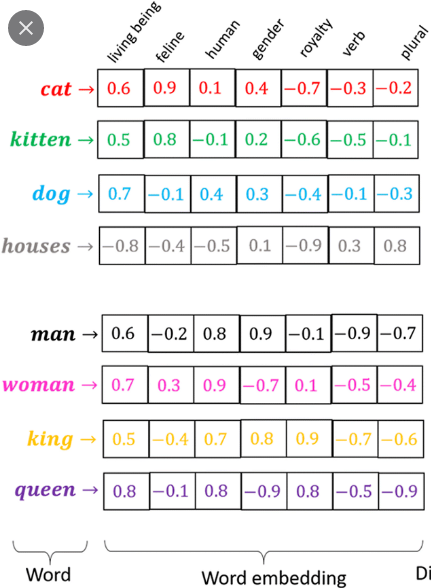

De esta manera, el texto podrá representarse de diferente manera para que la red pueda procesarlo en las GRU, las GRU se utilizan para
resolver la problematica de fuga de regresión (sucede cuando las redes aprenden muy poco en cada recurrencia), este fenomeno hace que las RNN olviden lo aprendido previamente. Las GRU cuentan con mecanismos internos llamados "gates" los cuales ayudan a regular el flujo de información y permiten diferenciar la información relevante del resto y ayuda a conservar o desechar dichos datos.


Este tipo de estructuras es muy utilizado en reconocimiento de voz, generación de texto y/o subtitulos.


El GRU cuenta con 2 puertas: la puerta de reinicio y la puerta de actualización, la update gate selecciona que información se desecha y cual se conserva, la reset gate permite definir la cantidad de información a desechar comparando la información alamacenada previamente en el hidden state y la información entrante.
Finalmente al uso de la función tangente para el reconocimiento de posibles candidatos para el hidden state ya que mantiene los datos durante el flujo de la red en valores entre 1 y -1, evitando el sesgo en la red.


Para ser procesado finalmente por una Capa Densa que nos devolvera la más secuencia siguiente más probable

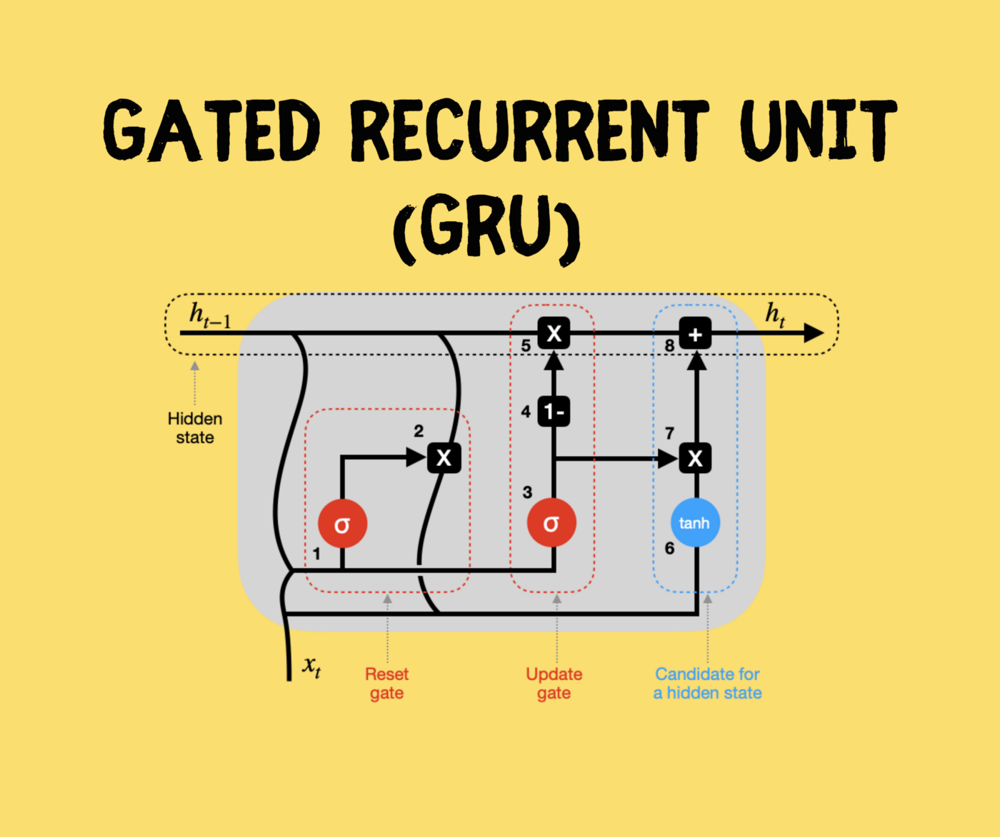

In [31]:
sampled_indices = tf.random.categorical(example_batch_predictions[0], num_samples=1)
sampled_indices = tf.squeeze(sampled_indices, axis=-1).numpy()

In [32]:
print("Input:\n", text_from_ids(input_example_batch[0]).numpy())
print()
print("Next Char Predictions:\n", text_from_ids(sampled_indices).numpy())

Input:
 b's words[UNK][UNK]rather let me say such the words of\r\nfate, enounced to destroy me. As he went on, I felt as'

Next Char Predictions:
 b";bI,VcHQK\r[UNK]1hIh67XIT8.OzDapjnt3MUwYRp1O7d[UNK]pRx\rQm5'znL,TPVl Ny,xyYd''kg8go y ,\nS,GSyXlM1VjEqHSAZ5b62'"


In [38]:
loss = tf.losses.SparseCategoricalCrossentropy(from_logits=True)

In [39]:
example_batch_mean_loss = loss(target_example_batch, example_batch_predictions)
print("Prediction shape: ", example_batch_predictions.shape, " # (batch_size, sequence_length, vocab_size)")
print("Mean loss:        ", example_batch_mean_loss)

Prediction shape:  (256, 100, 70)  # (batch_size, sequence_length, vocab_size)
Mean loss:         tf.Tensor(4.248494, shape=(), dtype=float32)


In [40]:
model.compile(optimizer='adam', loss=loss)

---

Entrenamiento de la Red

In [34]:
# Directory where the checkpoints will be saved
checkpoint_dir = './t_chkpoints'
# Name of the checkpoint files
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt_{epoch}")

checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_prefix,
    save_weights_only=True)

In [35]:
EPOCHS = 20

#NOTA
Cambiar el numero de EPOCHS en la celda anterior a minimo 120 para conseguir resultados coherentes o correr aprox 6 veces la celda de abajo (recomendable)

In [49]:
#" Entrenado 8 veces con 20 epocas total 12 min", a partir de la 3/6 epoca ya jala chido 7
history = model.fit(dataset, epochs=EPOCHS, callbacks=[checkpoint_callback],verbose=1)
model.save(checkpoint_dir)

Epoch 1/20
18/18 [==============================] - 6s 310ms/step - loss: 0.1174
Epoch 2/20
18/18 [==============================] - 5s 261ms/step - loss: 0.1272
Epoch 3/20
18/18 [==============================] - 5s 262ms/step - loss: 0.1366
Epoch 4/20
18/18 [==============================] - 5s 249ms/step - loss: 0.1412
Epoch 5/20
18/18 [==============================] - 4s 189ms/step - loss: 0.1364
Epoch 6/20
18/18 [==============================] - 5s 281ms/step - loss: 0.1261
Epoch 7/20
18/18 [==============================] - 5s 280ms/step - loss: 0.1132
Epoch 8/20
18/18 [==============================] - 4s 203ms/step - loss: 0.0978
Epoch 9/20
18/18 [==============================] - 4s 226ms/step - loss: 0.0860
Epoch 10/20
18/18 [==============================] - 5s 277ms/step - loss: 0.0782
Epoch 11/20
18/18 [==============================] - 4s 244ms/step - loss: 0.0728
Epoch 12/20
18/18 [==============================] - 5s 299ms/step - loss: 0.0699
Epoch 13/20
18/18 [======

In [43]:
class OneStep(tf.keras.Model):
  def __init__(self, model, chars_from_ids, ids_from_chars, temperature=1.0):
    super().__init__()
    self.temperature = temperature
    self.model = model
    self.chars_from_ids = chars_from_ids
    self.ids_from_chars = ids_from_chars

    # Create a mask to prevent "[UNK]" from being generated.
    skip_ids = self.ids_from_chars(['[UNK]'])[:, None]
    sparse_mask = tf.SparseTensor(
        # Put a -inf at each bad index.
        values=[-float('inf')]*len(skip_ids),
        indices=skip_ids,
        # Match the shape to the vocabulary
        dense_shape=[len(ids_from_chars.get_vocabulary())])
    self.prediction_mask = tf.sparse.to_dense(sparse_mask)

  @tf.function
  def generate_one_step(self, inputs, states=None):
    # Convert strings to token IDs.
    input_chars = tf.strings.unicode_split(inputs, 'UTF-8')
    input_ids = self.ids_from_chars(input_chars).to_tensor()

    # Run the model.
    # predicted_logits.shape is [batch, char, next_char_logits]
    predicted_logits, states = self.model(inputs=input_ids, states=states,
                                          return_state=True)
    # Only use the last prediction.
    predicted_logits = predicted_logits[:, -1, :]
    predicted_logits = predicted_logits/self.temperature
    # Apply the prediction mask: prevent "[UNK]" from being generated.
    predicted_logits = predicted_logits + self.prediction_mask

    # Sample the output logits to generate token IDs.
    predicted_ids = tf.random.categorical(predicted_logits, num_samples=1)
    predicted_ids = tf.squeeze(predicted_ids, axis=-1)

    # Convert from token ids to characters
    predicted_chars = self.chars_from_ids(predicted_ids)

    # Return the characters and model state.
    return predicted_chars, states

In [50]:
one_step_model = OneStep(model, chars_from_ids, ids_from_chars) 

#NOTA 
Puede modificarse la palabra inicial en:


    next_char = tf.constant(['death'])

y puede modificarse el tamaño de la secuencia a predecir en:

    for n in range(200):


In [51]:
import time
start = time.time()
states = None
next_char = tf.constant(['death'])
result = [next_char]

for n in range(200):
  next_char, states = one_step_model.generate_one_step(next_char, states=states)
  result.append(next_char)

result = tf.strings.join(result)
end = time.time()
print(result[0].numpy().decode('utf-8'), '\n\n' + '_'*80)
print('\nRun time:', end - start)

death. I dare not ask you to do what I think right, for I
may still be misled by passion.

for the first time that I did not even uttered, and I the sailors for med the well an
idstures before, I rage  

________________________________________________________________________________

Run time: 1.4399492740631104


In [52]:
interesting_results=[]
def save_results(result):
  interesting_results.append(result)

In [53]:
save_results(result)

---

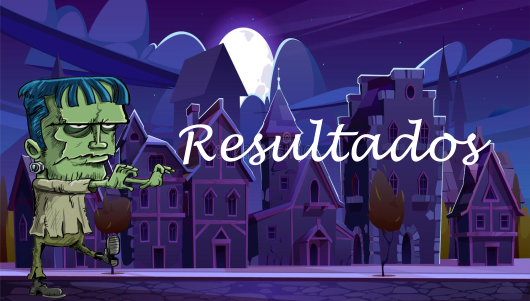

Con la ejecución final del codigo obtuvimos los siguientes resultados:

#Palabra Inicial: Union, 
#Tamaño de Secuencia requerida: 300 caracteres

Estracto obtenido

"union with me a sickening
sinks into a long time braught; with you on your wedding nights. I passed through
means cousin; I believe that it were better for you if you
were dead, for I fancy when they were nearly extinction, that I should I bend my steps towards the trees.

1.E.  If is impossible to"



Analizado por Grammarly

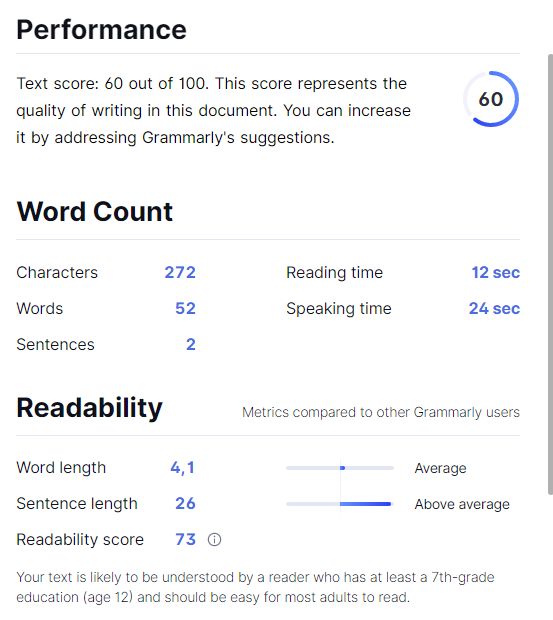

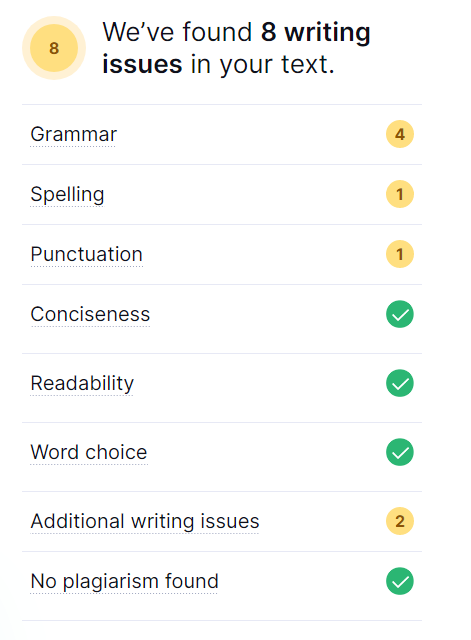

#Palabra Inicial: Devil, 
#Tamaño de Secuencia requerida: 1000 caracteres

Extracto obtenido:
"devil to reach other from
the heavens; but now trademark allowed myself somewhat step to
explained to me. As I sid, when it came its beauty and good; far every
thought with delay to Geneva, there was so glaring a case,
but I am glowing in the sledge, which had been judged in the
ice crow him; had pursued its works that could destroy such radiant innocence, and sco longed to a brother
can never, unkeredged and unother instruments by Elizabeth or a being again to convey me away, had
seen a contempt to be nature to heart in contemplate it.

I took my unhappiness to you, or that surprised myself be no
endurduced in me a restiance and good; me with delay by the whole point of precedded
These; a blank misfortune had such a declaration would have been welcome, instead of drink the true whom I had created. I had no regitt of
the earth and kindness on which the spirits that I endured, and I felt a kind"

Evaluación de Grammarly

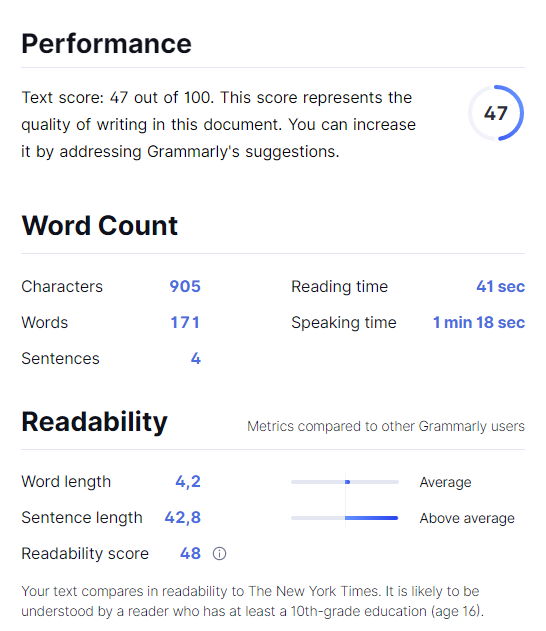

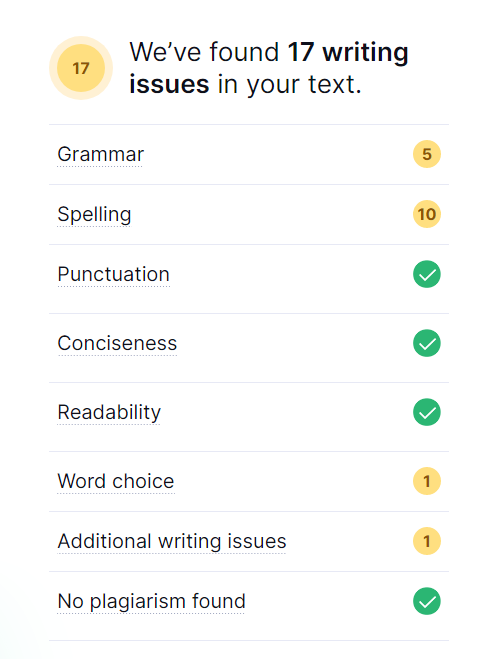

---

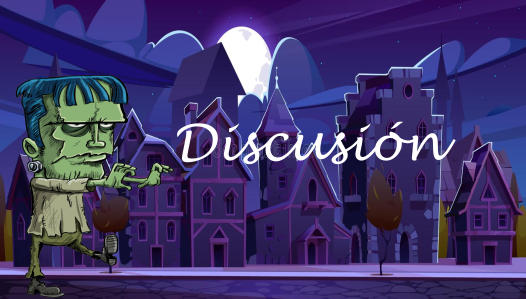

Como utilizamos un modelo preexistente no encontramos muchos problemas para la construccion e implementacion del modelo para este proyecto, eso sin embargo no significa que no tengamos muchas cosas que decir respecto a este trabajo, los resultados demuestran un resultado satisfactorio pero mejorable propbablemente a base de un entrenamiento mas extenso y una mejor preparacion de los datos o la utilizacion de textos mas actuales o con un lenguaje mas neutro ya que muchas obras y muchos autores tienen un lenguaje muy especifico y eso puede afectar el resultado final del modelo o pueden tener ciertos typos o patrones que no son muy comunes en el lenguaje actual y que pueden afectar el resultado final del modelo.

---

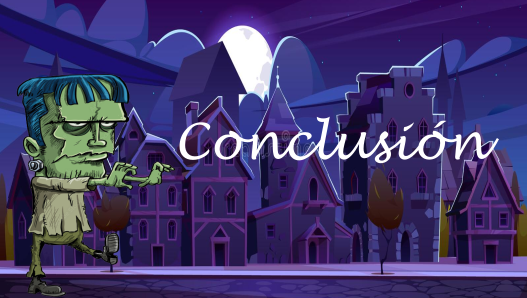

Los resultados del entrenamiento de la red neuronal convolucional implementada para la predicción de arritmias cardíacas son una muestra de la simplicidad que brinda Keras y TensorFlow para la creación de modelos de redes neuronales. A lo largo del desarrollo evaluamos un modelo que empleaba PyTorch y otros dos con Keras, TensorFlow, hasta que logramos disminuir el tiempo máquina a un aproximado de 5 minutos sin bajar nuestra precisión del 90%. Consideramos que un reto importante para la creación de este y futuros modelos de redes neuronales es el manejo de las estructuras de datos en el preprocesamiento de la información que le será alimentada al modelo, dado a que este probo ser el factor de retraso más significativo en la ejecución de la red. Así mismo, una aproximación al uso de PyTorch será conveniente cuando la simplicidad de nuestras librerías elegidas se vuelva contrario al desarrollo de vanguardia de esta disciplina.

---

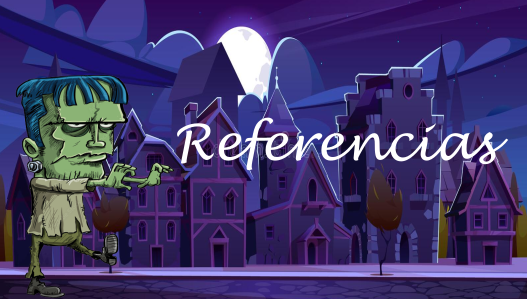



1. Text generation with an RNN  |. (s. f.). TensorFlow. Recuperado 13 de octubre de 2022, de https://www.tensorflow.org/text/tutorials/text_generation



---